In [1]:
import pandas as pd
import numpy as np
import igraph as ig
import collections
import matplotlib
%matplotlib inline

## Explore Data

In [2]:
df_unweighted = pd.read_csv('combined_final_unweighted.csv')
df_unweighted

,node_start,node_end,status
0,Hong Kong,Samoa,jurisdiction
1,Hong Kong,Samoa,jurisdiction
2,Hong Kong,Samoa,jurisdiction
3,Hong Kong,Samoa,jurisdiction
4,Hong Kong,Samoa,jurisdiction
...,...,...,...
338127,Indonesia,British Virgin Islands,officer_base
338128,Cook Islands,British Virgin Islands,officer_base
338129,Hong Kong,British Virgin Islands,officer_base
338130,Cook Islands,United Kingdom,officer_base


In [3]:
df_weighted = pd.read_csv('combined_final_weighted.csv')
df_weighted

,node_start,node_end,status,weight
0,Hong Kong,Samoa,jurisdiction,2.0
1,Hong Kong,Samoa,jurisdiction,2.0
2,Hong Kong,Samoa,jurisdiction,2.0
3,Hong Kong,Samoa,jurisdiction,2.0
4,Hong Kong,Samoa,jurisdiction,2.0
...,...,...,...,...
338119,Indonesia,British Virgin Islands,officer_base,1.0
338120,Cook Islands,British Virgin Islands,officer_base,1.0
338121,Hong Kong,British Virgin Islands,officer_base,1.0
338122,Cook Islands,United Kingdom,officer_base,1.0


In [4]:
df_weighted['status'].unique()

array(['jurisdiction', 'intermediary_base', 'intermediary_jurisdiction',
       'officer_base', 'officer_jurisdiction'], dtype=object)

In [5]:
jurisdiction_status_list = ['jurisdiction','officer_base','officer_jurisdiction']

In [6]:
df_weighted_jur = df_weighted[df_weighted['status'].isin(jurisdiction_status_list)]
df_jur = df_weighted_jur.drop(['status'], axis = 1)
df_jur

,node_start,node_end,weight
0,Hong Kong,Samoa,2.0
1,Hong Kong,Samoa,2.0
2,Hong Kong,Samoa,2.0
3,Hong Kong,Samoa,2.0
4,Hong Kong,Samoa,2.0
...,...,...,...
338119,Indonesia,British Virgin Islands,1.0
338120,Cook Islands,British Virgin Islands,1.0
338121,Hong Kong,British Virgin Islands,1.0
338122,Cook Islands,United Kingdom,1.0


In [7]:
df_jur_grouped = df_jur.groupby(['node_start','node_end'], as_index = False).sum()
df_jur_grouped

,node_start,node_end,weight
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2750,Zimbabwe,Hong Kong,3.0
2751,Zimbabwe,Jersey,1.0
2752,Zimbabwe,Panama,6.0
2753,Zimbabwe,Russia,2.0


### Convert Data to an Undirected Edge List

In [8]:
df_jur_grouped_list = df_jur_grouped.values.tolist()
df_jur_grouped_list

[['Albania', 'Bahamas', 4.0],
 ['Algeria', 'British Virgin Islands', 2.0],
 ['Algeria', 'United Kingdom', 2.0],
 ['Algeria', 'United States', 1.0],
 ['Andorra', 'Bahamas', 52.0],
 ['Andorra', 'British Virgin Islands', 82.0],
 ['Andorra', 'Cayman Islands', 2.0],
 ['Andorra', 'Costa Rica', 6.0],
 ['Andorra', 'Hong Kong', 18.0],
 ['Andorra', 'Ireland', 1.0],
 ['Andorra', 'Latvia', 1.0],
 ['Andorra', 'Nevada', 48.0],
 ['Andorra', 'Niue', 24.0],
 ['Andorra', 'Panama', 558.0],
 ['Andorra', 'Russia', 2.0],
 ['Andorra', 'Samoa', 18.0],
 ['Andorra', 'Seychelles', 144.0],
 ['Andorra', 'United Kingdom', 2.0],
 ['Andorra', 'Uruguay', 30.0],
 ['Angola', 'Bermuda', 2.0],
 ['Angola', 'British Virgin Islands', 23.0],
 ['Angola', 'China', 1.0],
 ['Antigua and Barbuda', 'Barbados', 16.0],
 ['Antigua and Barbuda', 'British Virgin Islands', 12.0],
 ['Antigua and Barbuda', 'Canada', 1.0],
 ['Antigua and Barbuda', 'Cayman Islands', 2.0],
 ['Antigua and Barbuda', 'China', 4.0],
 ['Antigua and Barbuda', 'Hong

In [9]:
d = collections.defaultdict(int)
for n1, n2, v in df_jur_grouped_list:
    d[min(n1, n2), max(n1, n2)] += v
result = [[k[0], k[1], v] for k, v in d.items()]

In [10]:
df_net = pd.DataFrame(result)
df_net

,0,1,2
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2337,Hong Kong,Zimbabwe,3.0
2338,Jersey,Zimbabwe,1.0
2339,Panama,Zimbabwe,6.0
2340,Russia,Zimbabwe,2.0


In [11]:
df_net = df_net.rename(columns = {0:'node_1', 1:'node_2', 2: 'weight'})
df_net

,node_1,node_2,weight
0,Albania,Bahamas,4.0
1,Algeria,British Virgin Islands,2.0
2,Algeria,United Kingdom,2.0
3,Algeria,United States,1.0
4,Andorra,Bahamas,52.0
...,...,...,...
2337,Hong Kong,Zimbabwe,3.0
2338,Jersey,Zimbabwe,1.0
2339,Panama,Zimbabwe,6.0
2340,Russia,Zimbabwe,2.0


In [12]:
#df_net.to_csv('undirected_weighted_grouped.csv', index = False)

In [13]:
df_net.describe()

,weight
count,2342.000000
mean,232.952391
std,1900.762125
min,0.500000
25%,2.000000
50%,6.000000
75%,30.000000
max,65010.000000


## Create Graph

In [14]:
g = ig.Graph.TupleList(df_net.itertuples(index=False), directed=False, edge_attrs={'weight': "weight"})


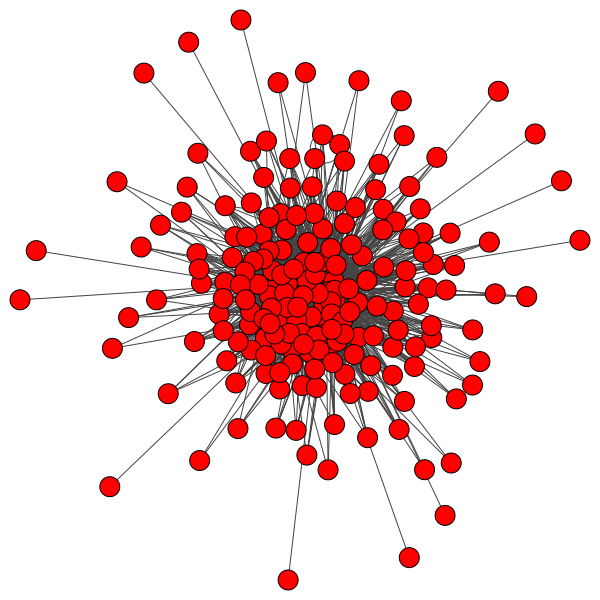

In [15]:
ig.plot(g)

In [16]:
g.diameter()

3

In [17]:
print( "Clustering Coefficient: ", g.transitivity_undirected())

Clustering Coefficient:  0.3829243625911535


In [18]:
np.mean(g.degree())

24.02051282051282

In [19]:
np.mean(g.strength(weights = 'weight'))

5595.635897435897

In [20]:
df_strength = pd.DataFrame({'name': list(g.vs['name']), 'weighted_degree':g.strength(weights = 'weight') } )
df_strength = df_strength.sort_values('weighted_degree', ascending = False).reset_index(drop = True)
df_strength

,name,weighted_degree
0,British Virgin Islands,283283.5
1,Hong Kong,110569.0
2,Panama,109720.0
3,Switzerland,77116.0
4,Bahamas,40682.0
...,...,...
190,Guinea,2.0
191,Yemen,2.0
192,Sudan,2.0
193,Benin,1.0


### Metrics

In [20]:
def get_diameter(community):
    
    diameters = []
    
    for i in range(len(community.subgraphs())):
    
        diameters.append(community.subgraphs()[i].diameter())

    return (diameters)

In [21]:
def get_transitivity(community):
    
    transitivity = []
    
    for i in range(len(community.subgraphs())):
    
        transitivity.append(community.subgraphs()[i].transitivity_undirected())

    return (transitivity)

In [22]:
def get_avg_degree(community):
    
    degree = []
    
    for i in range(len(community.subgraphs())):
    
        degree.append(np.mean(community.subgraphs()[i].degree()))

    return degree

In [23]:
def get_avg_weighted_degree(community):
    
    weighted_degree = []
    
    for i in range(len(community.subgraphs())):
    
        weighted_degree.append(np.mean(community.subgraphs()[i].strength(weights = 'weight')))

    return weighted_degree

## Community Detection

### Louvain Community Detection

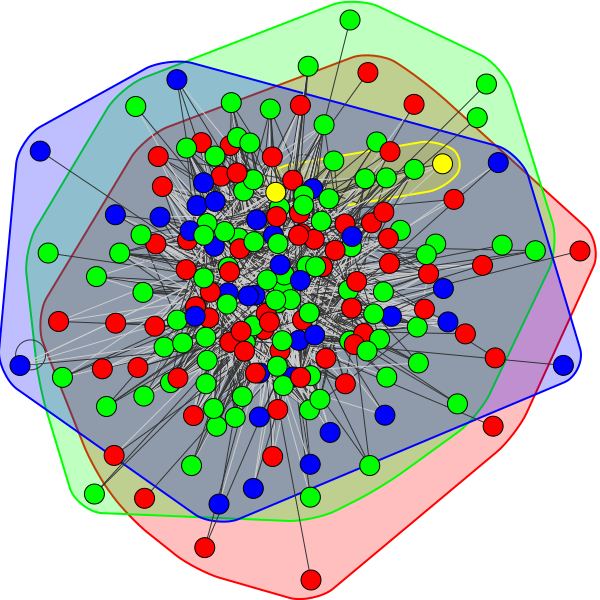

In [24]:
comm_louvain = g.community_multilevel(weights = 'weight')

ig.plot(comm_louvain, mark_groups = True, layout="drl")

In [25]:
modularity = g.modularity(comm_louvain, weights='weight')
print(modularity)

0.16155860425642238


In [26]:
print('average weighted degree: ', get_avg_weighted_degree(comm_louvain))
print('average degree: ', get_avg_degree(comm_louvain))
print('transitivity: ', get_transitivity(comm_louvain))
print('diameter: ', get_diameter(comm_louvain))

average weighted degree:  [3196.4347826086955, 5106.6741573033705, 421.74285714285713, 844.0]
average degree:  [8.26086956521739, 14.067415730337078, 5.828571428571428, 1.0]
transitivity:  [0.2930897537728356, 0.375547703180212, 0.34872217642209397, nan]
diameter:  [4, 2, 3, 1]


In [27]:
df_louvain = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_louvain.membership } )
df_louvain

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,0
191,Vietnam,1
192,Yemen,0
193,Zambia,1


In [28]:
df_louvain.describe()

,community
count,195.000000
mean,0.846154
std,0.743995
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,3.000000


In [29]:
df_louvain[df_louvain['community'] == 0]

,name,community
0,Albania,0
1,Bahamas,0
6,Andorra,0
8,Costa Rica,0
12,Nevada,0
...,...,...
176,Sudan,0
178,Syria,0
188,Dubai,0
190,Venezuela,0


In [30]:
df_louvain[df_louvain['community'] == 1].head(99)

,name,community
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
9,Hong Kong,1
10,Ireland,1
...,...,...
187,Uganda,1
189,Uzbekistan,1
191,Vietnam,1
193,Zambia,1


In [31]:
df_louvain[df_louvain['community'] == 2]

,name,community
5,United States,2
7,Cayman Islands,2
16,Samoa,2
20,Bermuda,2
23,Barbados,2
25,Saint Kitts and Nevis,2
28,New Zealand,2
34,Austria,2
43,Netherlands,2
46,Sweden,2


In [32]:
df_louvain[df_louvain['community'] == 3]

,name,community
88,Labuan,3
89,Malaysia,3


In [33]:
df_louvain[df_louvain['community'] == 4]

,name,community


In [34]:
# Define colors used for visualization
colors = ['blue', 'yellow', 'green','purple', 'pink', 'orange', 'lightcoral', 'plum', 'darkgreen', 'darkblue', 'rosybrown',
         'crimson', 'steelblue', 'khaki', 'moccasin', 'orangered', 'fuchsia', 'thistle', 'salmon', 'chocolate', 'lightseagreen',
         'springgreen', 'darkseagreen', 'deeppink', 'mediumvioletred','olive']

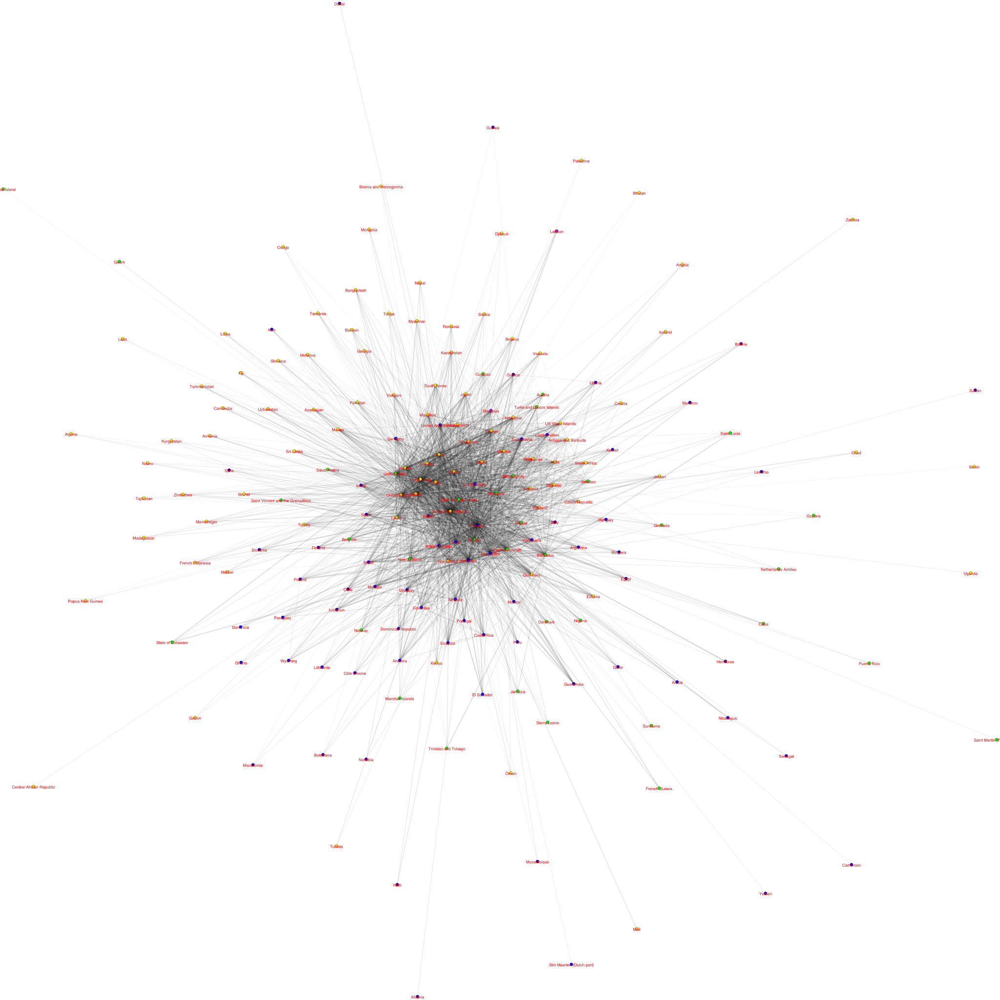

In [35]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_louvain.membership)):
    vertex_colors.append(colors[comm_louvain.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/louvain_communities.png', vertex_label = g.vs['name'] , **visual_style)

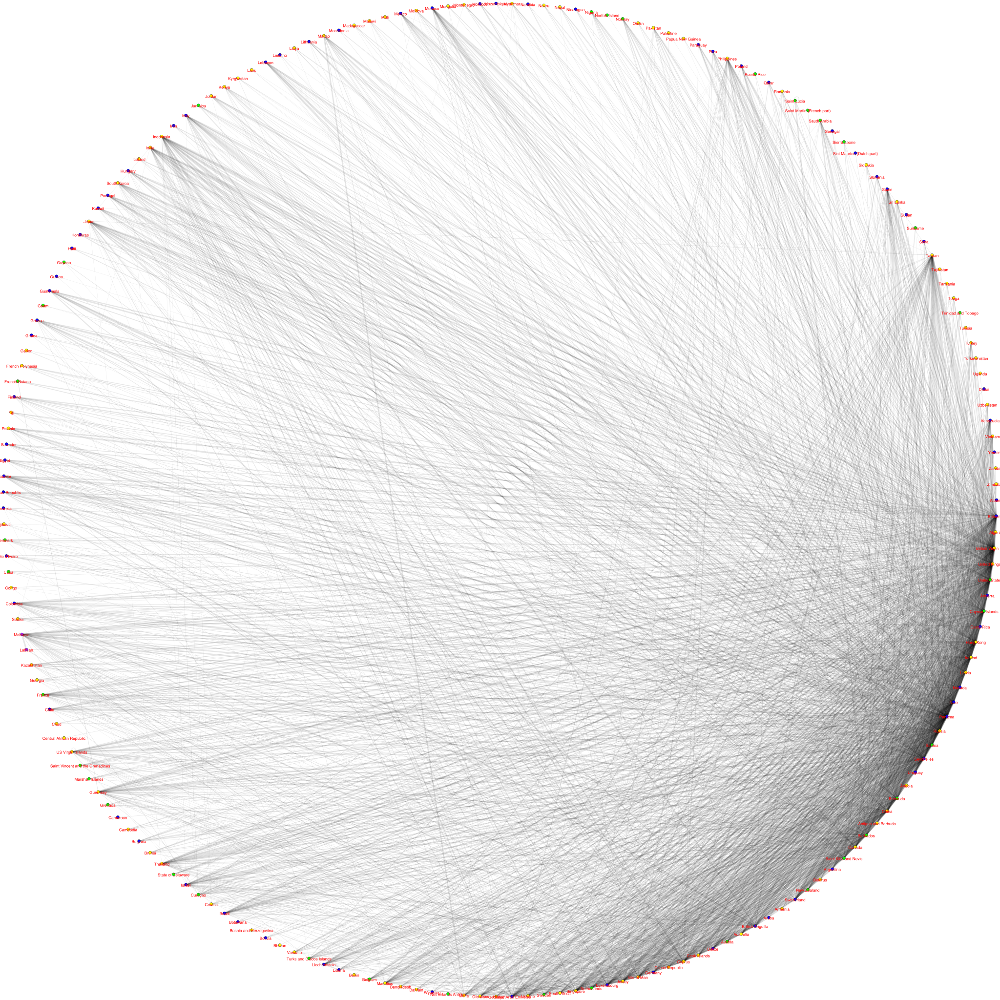

In [36]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/louvain_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [37]:
for i in range(len(comm_louvain.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_louvain.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_louvain.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_louvain.subgraphs()[i],'no_intermediary_images/louvain_subgraph' + str(i) + '.png' ,vertex_label = comm_louvain.subgraphs()[i].vs['name'],**visual_style  )
    
    
    

In [38]:
# # Set vertex colours

# visual_style["bbox"] = (300,300)
# visual_style["margin"] = 17
# visual_style["vertex_color"] = 'orange'

# # Set vertex label size
# visual_style["vertex_label_size"] = 15

# # Set the layout
# my_layout = comm_louvain.cluster_graph().layout_fruchterman_reingold()
# visual_style["layout"] = my_layout

# ig.plot(comm_louvain.cluster_graph(),'no_intermediary_images/test_cluster_graph.png' ,vertex_label = range(comm_louvain.cluster_graph().vcount()),**visual_style  )


### Label Propogation Community Detection

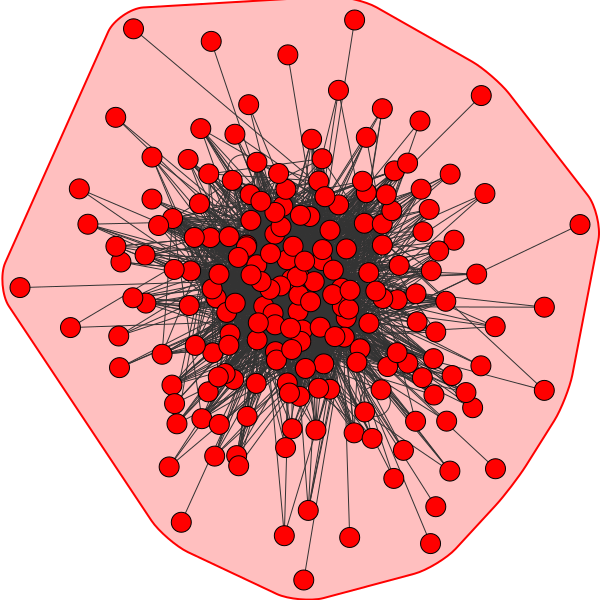

In [39]:
comm_lp= g.community_label_propagation(weights = 'weight')

ig.plot(comm_lp, mark_groups = True, layout="drl")

In [40]:
print('average weighted degree: ', get_avg_weighted_degree(comm_lp))
print('average degree: ', get_avg_degree(comm_lp))
print('transitivity: ', get_transitivity(comm_lp))
print('diameter: ', get_diameter(comm_lp))

average weighted degree:  [5595.635897435897]
average degree:  [24.02051282051282]
transitivity:  [0.3829243625911535]
diameter:  [3]


In [41]:
modularity = g.modularity(comm_lp, weights='weight')
print(modularity)

0.0


### Leading Eigenvector Community Detection

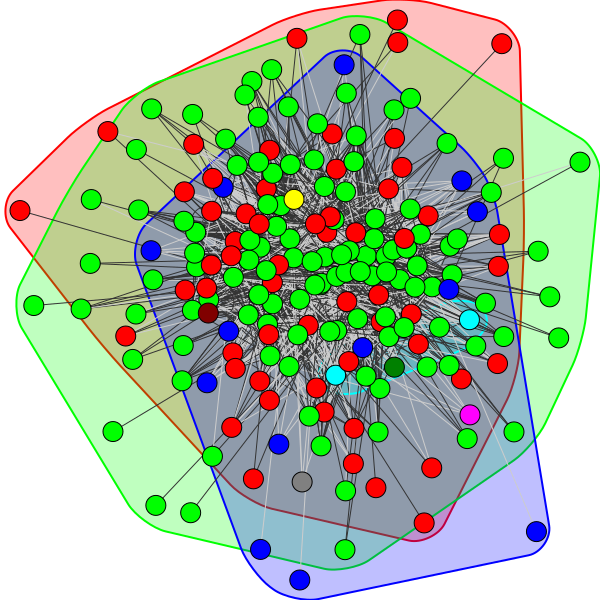

In [42]:
comm_leading_eigenvector= g.community_leading_eigenvector(weights = 'weight')

ig.plot(comm_leading_eigenvector, mark_groups = True, layout="drl")

In [43]:
modularity = g.modularity(comm_leading_eigenvector, weights='weight')
print(modularity)

0.14953077135100648


In [44]:
print('average weighted degree: ', get_avg_weighted_degree(comm_leading_eigenvector))
print('average degree: ', get_avg_degree(comm_leading_eigenvector))
print('transitivity: ', get_transitivity(comm_leading_eigenvector))
print('diameter: ', get_diameter(comm_leading_eigenvector))

average weighted degree:  [3397.7586206896553, 4895.692307692308, 0.0, 0.0, 0.0, 1.0, 0.0, 16.0, 0.0]
average degree:  [7.655172413793103, 18.99145299145299, 0.0, 0.0, 0.0, 1.0, 0.0, 2.0, 0.0]
transitivity:  [0.27990271943400397, 0.44260359931244436, nan, nan, nan, nan, nan, nan, nan]
diameter:  [3, 2, 0, 0, 0, 1, 0, 0, 0]


In [45]:
df_leading_eigenvector = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_leading_eigenvector.membership } )
df_leading_eigenvector

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,0
191,Vietnam,1
192,Yemen,0
193,Zambia,1


In [46]:
df_leading_eigenvector.describe()

,community
count,195.000000
mean,0.928205
std,1.076925
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,8.000000


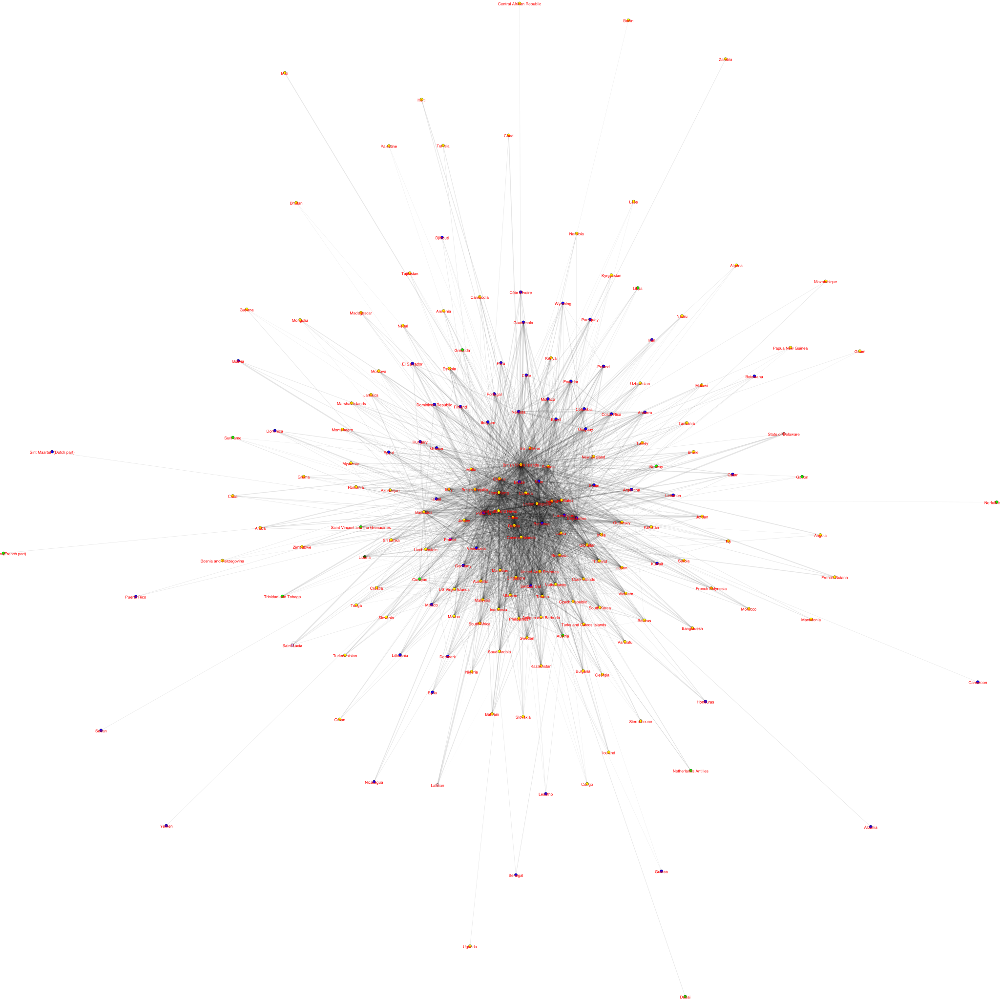

In [47]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_leading_eigenvector.membership)):
    vertex_colors.append(colors[comm_leading_eigenvector.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/communities_leading_eigenvector.png', vertex_label = g.vs['name'] , **visual_style)

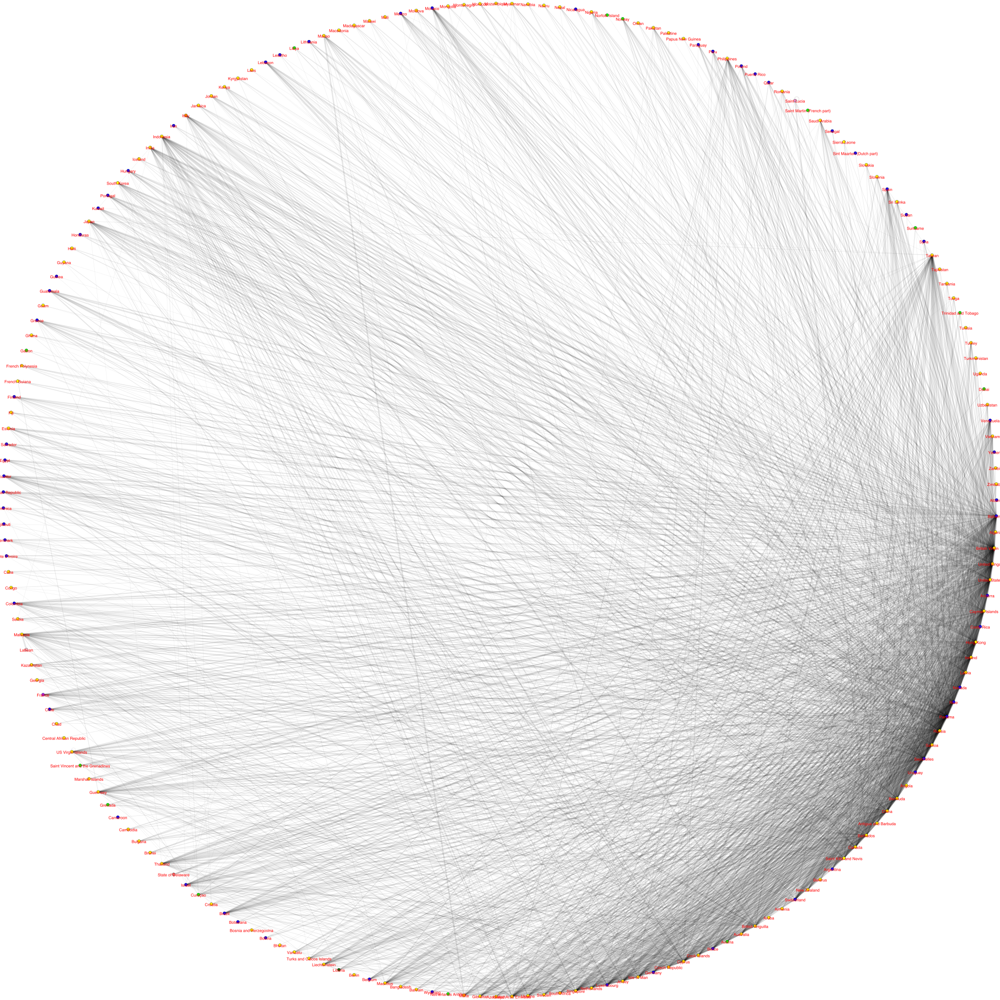

In [48]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/leading_vector_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [49]:
for i in range(len(comm_leading_eigenvector.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_leading_eigenvector.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_leading_eigenvector.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_leading_eigenvector.subgraphs()[i],'no_intermediary_images/leading_eigenvector_subgraph' + str(i) + '.png' ,vertex_label = comm_leading_eigenvector.subgraphs()[i].vs['name'],**visual_style  )
    

### Leiden Community Detection

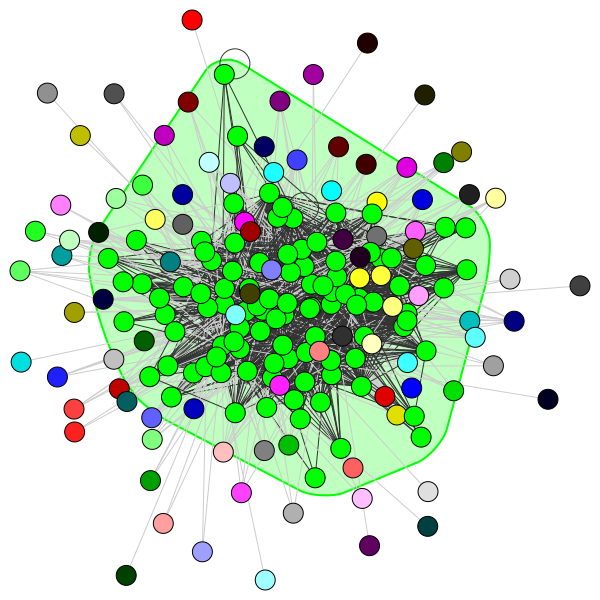

In [50]:
comm_leiden = g.community_leiden(weights = 'weight')

ig.plot(comm_leiden, mark_groups = True, layout="drl")

In [51]:
modularity = g.modularity(comm_leiden, weights='weight')
print(modularity)

-5.937673476843052e-06


In [52]:
print('average weighted degree: ', get_avg_weighted_degree(comm_leiden))
print('average degree: ', get_avg_degree(comm_leiden))
print('transitivity: ', get_transitivity(comm_leiden))
print('diameter: ', get_diameter(comm_leiden))

average weighted degree:  [0.0, 10858.85, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 35.66, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

In [53]:
df_leiden = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_leiden.membership } )
df_leiden

,name,community
0,Albania,0
1,Bahamas,1
2,Algeria,2
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,1
191,Vietnam,1
192,Yemen,93
193,Zambia,94


In [54]:
df_leiden.describe()

,community
count,195.000000
mean,23.892308
std,30.384540
min,0.000000
25%,1.000000
50%,1.000000
75%,46.500000
max,95.000000


In [55]:
## no visualisation as most communities are individual?

### Spinglass Community Detection

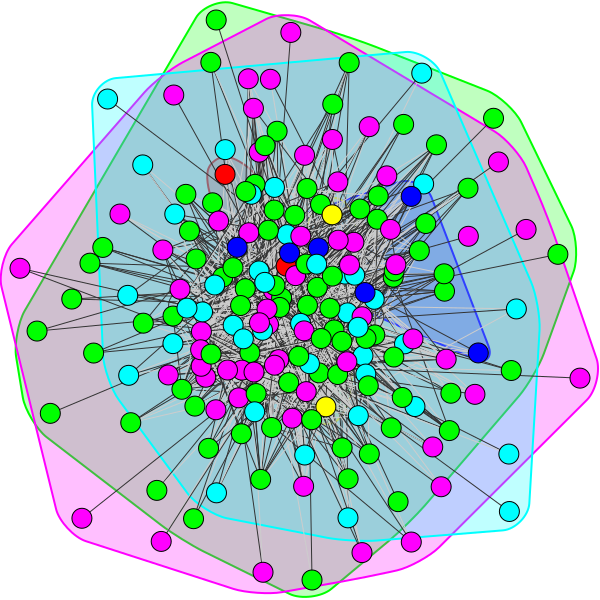

In [56]:
comm_spinglass = g.community_spinglass(weights = 'weight')

ig.plot(comm_spinglass, mark_groups = True, layout="drl")

In [57]:
modularity = g.modularity(comm_spinglass, weights='weight')
print(modularity)

0.16253968001150193


In [58]:
print('average weighted degree: ', get_avg_weighted_degree(comm_spinglass))
print('average degree: ', get_avg_degree(comm_spinglass))
print('transitivity: ', get_transitivity(comm_spinglass))
print('diameter: ', get_diameter(comm_spinglass))

average weighted degree:  [844.0, 5311.788235294118, 264.0, 230.0, 3497.5, 410.075]
average degree:  [1.0, 12.635294117647058, 2.0, 1.0, 7.6, 6.5]
transitivity:  [nan, 0.3448335644937587, 0.0, nan, 0.295627583206439, 0.3847487001733102]
diameter:  [1, 2, 2, 1, 4, 3]


In [59]:
df_spinglass = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_spinglass.membership } )
df_spinglass

,name,community
0,Albania,4
1,Bahamas,4
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,4
191,Vietnam,1
192,Yemen,4
193,Zambia,1


In [60]:
df_spinglass.describe()

,community
count,195.000000
mean,2.784615
std,1.721534
min,0.000000
25%,1.000000
50%,4.000000
75%,4.000000
max,5.000000


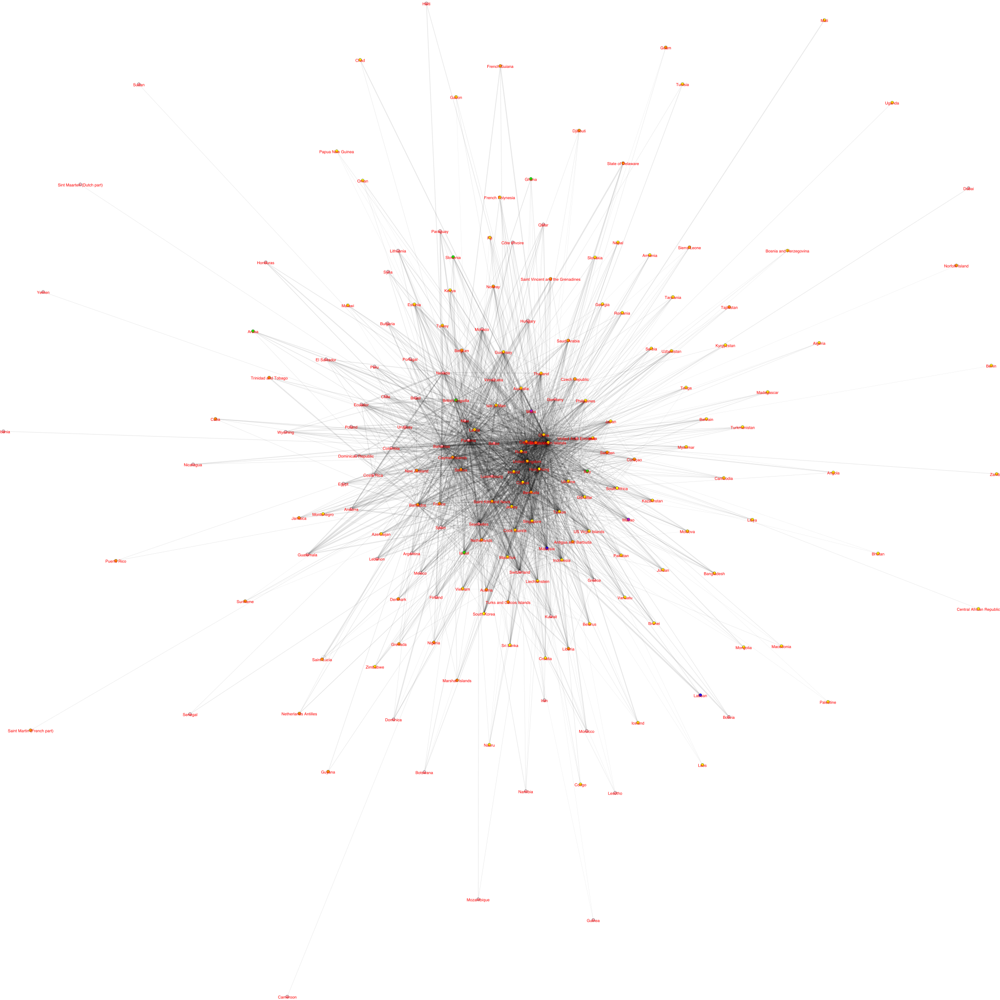

In [61]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_spinglass.membership)):
    vertex_colors.append(colors[comm_spinglass.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/communities_spinglass.png', vertex_label = g.vs['name'] , **visual_style)

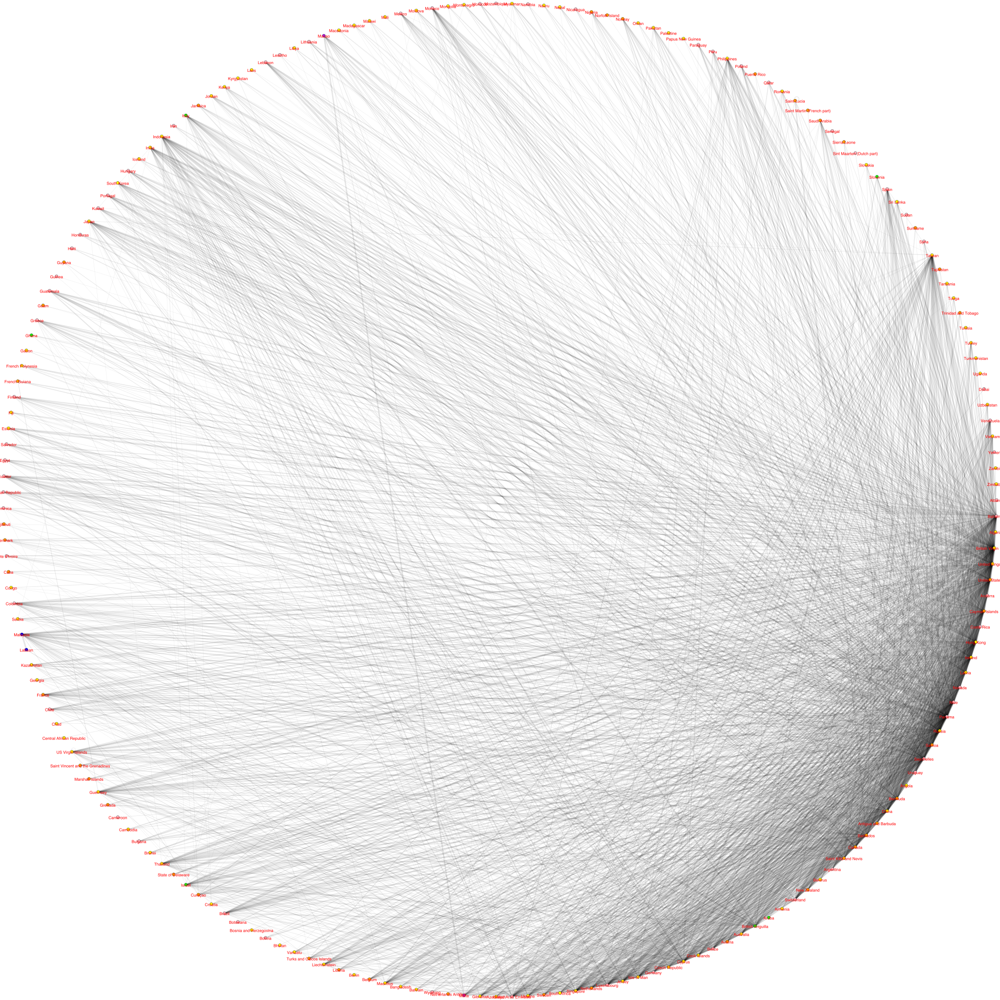

In [62]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/spinglass_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [63]:
for i in range(len(comm_spinglass.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_spinglass.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_spinglass.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_spinglass.subgraphs()[i],'no_intermediary_images/spinglass_subgraph' + str(i) + '.png' ,vertex_label = comm_spinglass.subgraphs()[i].vs['name'],**visual_style  )
    

### Walktrap Community Detection

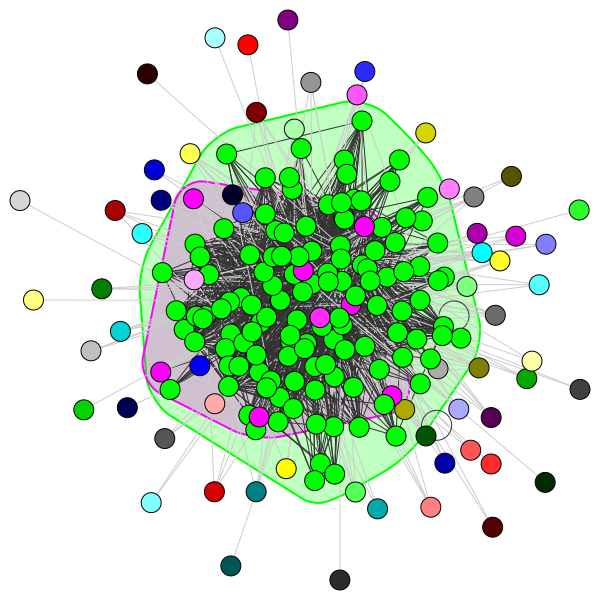

In [64]:
walktrap = g.community_walktrap(weights = 'weight', steps = 2)

comm_walktrap = walktrap.as_clustering()

ig.plot(comm_walktrap, mark_groups = True, layout="drl")

In [65]:
modularity = g.modularity(comm_walktrap, weights='weight')
print(modularity)

0.002853281418006583


In [66]:
print('average weighted degree: ', get_avg_weighted_degree(comm_walktrap))
print('average degree: ', get_avg_degree(comm_walktrap))
print('transitivity: ', get_transitivity(comm_walktrap))
print('diameter: ', get_diameter(comm_walktrap))

average weighted degree:  [0.0, 8642.008064516129, 0.0, 0.0, 54.285714285714285, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
average degree:  [0.0, 31.596774193548388, 0.0, 0.0, 1.7142857142857142, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
transitivity:  [nan, 0.4614273777519436, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

In [67]:
df_walktrap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_walktrap.membership } )
df_walktrap

,name,community
0,Albania,0
1,Bahamas,1
2,Algeria,2
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,1
191,Vietnam,1
192,Yemen,63
193,Zambia,64


In [68]:
df_walktrap.describe()

,community
count,195.000000
mean,11.753846
std,18.576144
min,0.000000
25%,1.000000
50%,1.000000
75%,16.500000
max,65.000000


In [69]:
## no visualisation since too many communities, mostly individual

### Infomap Community Detection

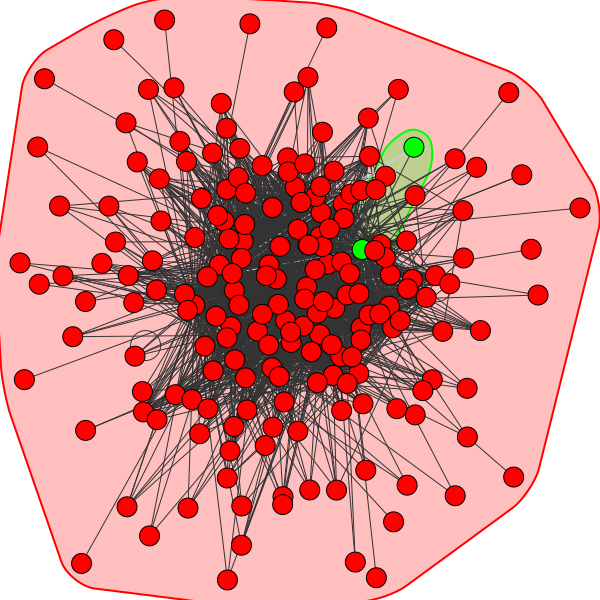

In [70]:
comm_infomap = g.community_infomap(edge_weights = 'weight')

ig.plot(comm_infomap, mark_groups = True, layout="drl")

In [71]:
modularity = g.modularity(comm_infomap, weights='weight')
print(modularity)

0.003060166215323723


In [72]:
print('average weighted degree: ', get_avg_weighted_degree(comm_infomap))
print('average degree: ', get_avg_degree(comm_infomap))
print('transitivity: ', get_transitivity(comm_infomap))
print('diameter: ', get_diameter(comm_infomap))

average weighted degree:  [5615.870466321244, 844.0]
average degree:  [23.83419689119171, 1.0]
transitivity:  [0.3811861583001038, nan]
diameter:  [3, 1]


In [73]:
df_infomap = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_infomap.membership } )
df_infomap

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,0
3,British Virgin Islands,0
4,United Kingdom,0
...,...,...
190,Venezuela,0
191,Vietnam,0
192,Yemen,0
193,Zambia,0


In [74]:
## no visualisation since no community is detected

### Fast Greedy Community Detection

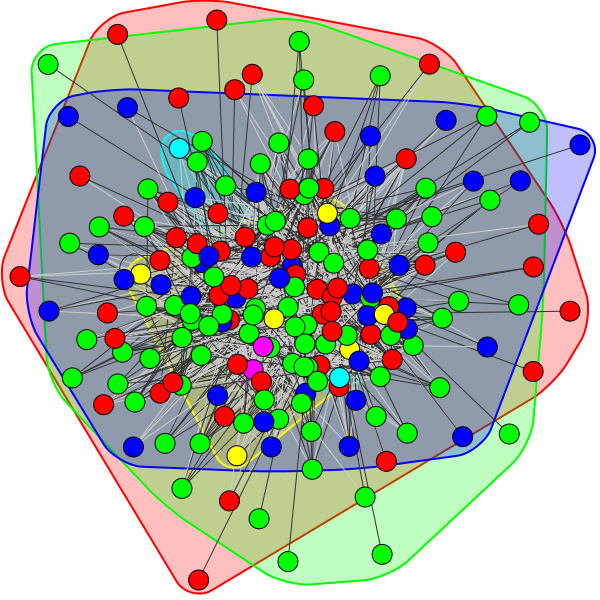

In [75]:
fg = g.community_fastgreedy(weights = 'weight')

comm_fastgreedy = fg.as_clustering()

ig.plot(comm_fastgreedy, mark_groups = True, layout="drl")

In [76]:
modularity = g.modularity(comm_fastgreedy, weights='weight')
print(modularity)

0.16253968001150187


print('average weighted degree: ', get_avg_weighted_degree(comm_fastgreedy))
print('average degree: ', get_avg_degree(comm_fastgreedy))
print('transitivity: ', get_transitivity(comm_fastgreedy))
print('diameter: ', get_diameter(comm_fastgreedy))

In [77]:
df_fastgreedy = pd.DataFrame({'name': list(g.vs['name']), 'community':comm_fastgreedy.membership } )
df_fastgreedy

,name,community
0,Albania,0
1,Bahamas,0
2,Algeria,1
3,British Virgin Islands,1
4,United Kingdom,1
...,...,...
190,Venezuela,0
191,Vietnam,1
192,Yemen,0
193,Zambia,1


In [78]:
df_fastgreedy.describe()

,community
count,195.000000
mean,1.030769
std,0.946549
min,0.000000
25%,0.000000
50%,1.000000
75%,2.000000
max,5.000000


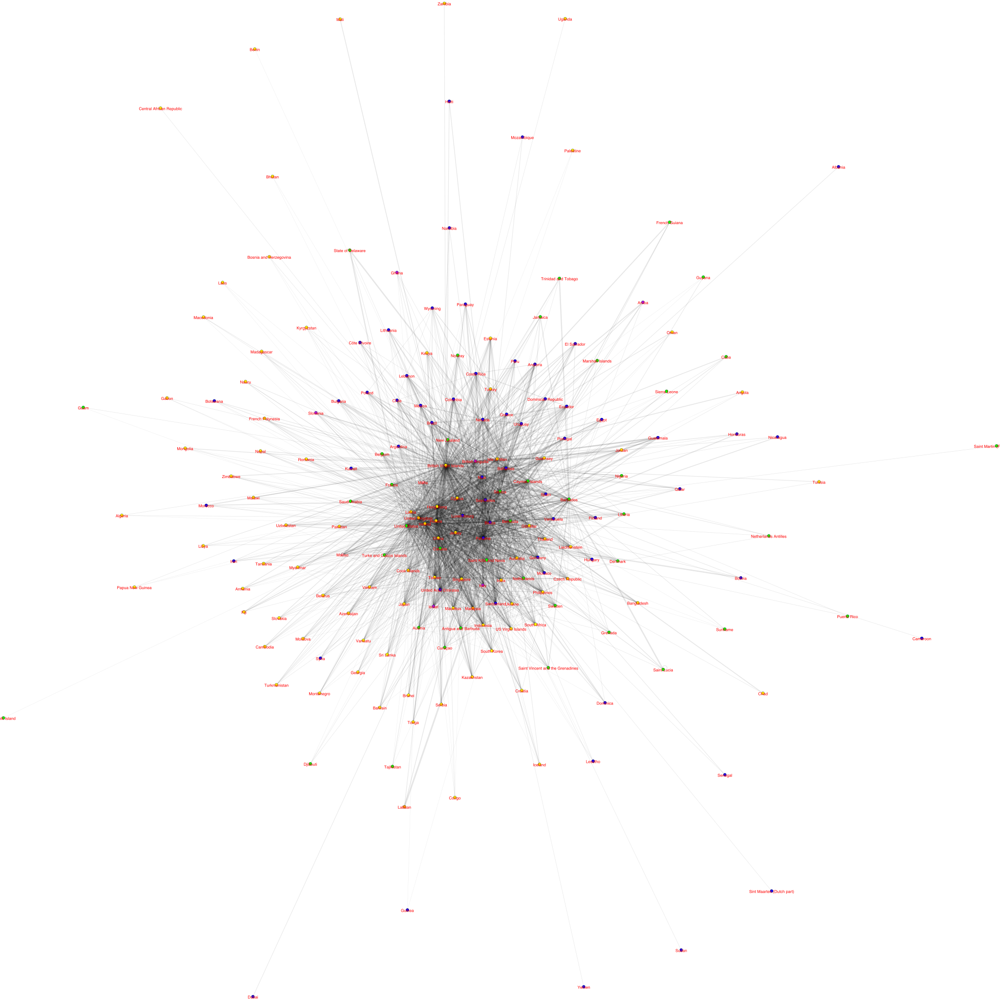

In [79]:
##plot community
visual_style = {}

vertex_colors = []

for i in range(len(comm_fastgreedy.membership)):
    vertex_colors.append(colors[comm_fastgreedy.membership[i]])
    
# Set bbox and margin
visual_style["bbox"] = (5000,5000)
visual_style["margin"] = 17

# Set vertex colours
visual_style["vertex_color"] = vertex_colors

# Set edge width
visual_style["edge_width"] = np.log(g.es['weight']) + 1

# Set edge color
visual_style["edge_color"] = "rgba(1,1,1,0.1)" 

# Set vertex size
visual_style["vertex_size"] = 15

# Set vertex label size
visual_style["vertex_label_size"] = 20

# Set vertex label color
visual_style["vertex_label_color"] = 'red'

# Don't curve the edges
visual_style["edge_curved"] = False

# Set the layout
my_layout = g.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/communities_fastgreedy.png', vertex_label = g.vs['name'] , **visual_style)

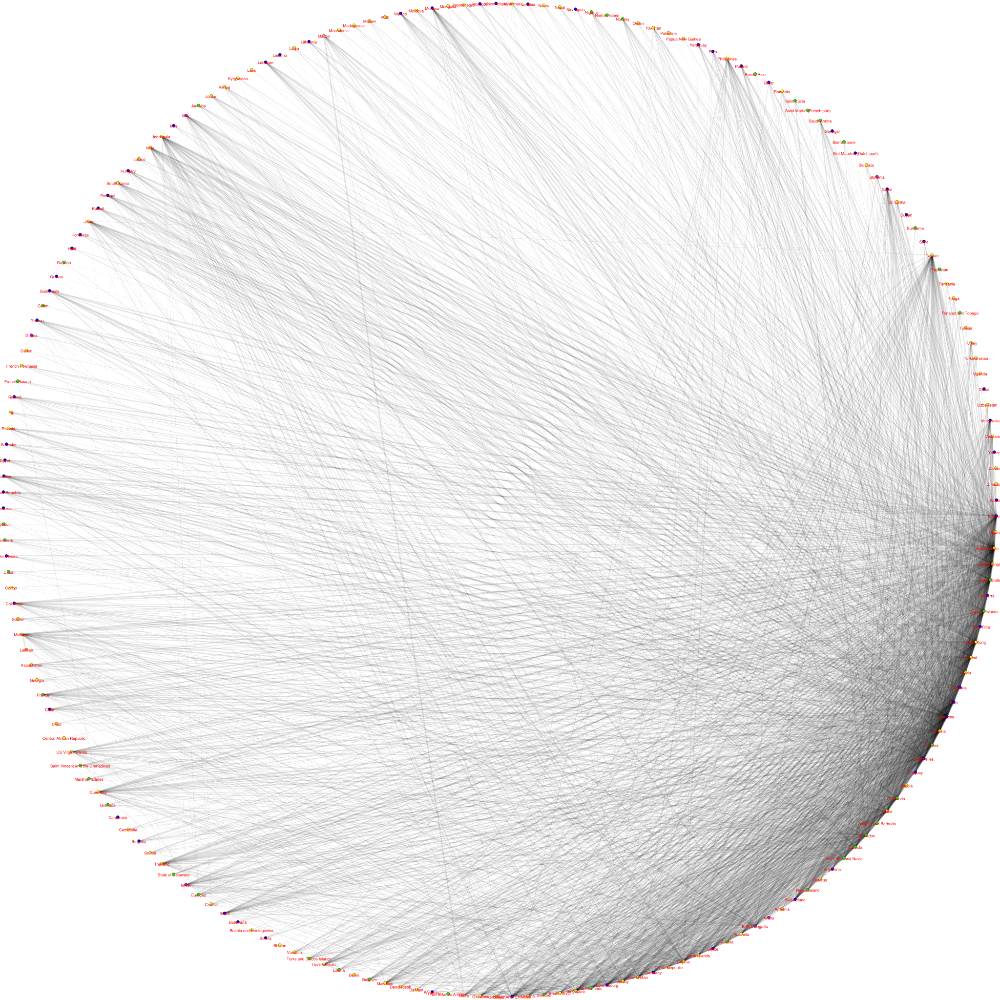

In [80]:
# Set the layout
my_layout = g.layout_circle()
visual_style["layout"] = my_layout

# Plot the graph
ig.plot(g,'no_intermediary_images/fastgreedy_circular.png', vertex_label = g.vs['name'] , **visual_style)

In [81]:
for i in range(len(comm_fastgreedy.subgraphs())):
    
    visual_style["bbox"] = (2000,2000)
    visual_style["margin"] = 17
    
    # Set vertex colours
    visual_style["vertex_color"] = 'green'

    # Set edge width
    visual_style["edge_width"] = np.log(comm_fastgreedy.subgraphs()[i].es['weight']) + 1
    # Set the layout
    my_layout = comm_fastgreedy.subgraphs()[i].layout_fruchterman_reingold()
    visual_style["layout"] = my_layout

    ig.plot(comm_fastgreedy.subgraphs()[i],'no_intermediary_images/fastgreedy_subgraph' + str(i) + '.png' ,vertex_label = comm_fastgreedy.subgraphs()[i].vs['name'],**visual_style  )
    